# Explore here

In [1]:
import keras.src.utils
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from IPython.display import Image, display
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [2]:
#display few images from cats and dogs
#display(Image(filename='../data/raw/train/cat.1.jpg'))

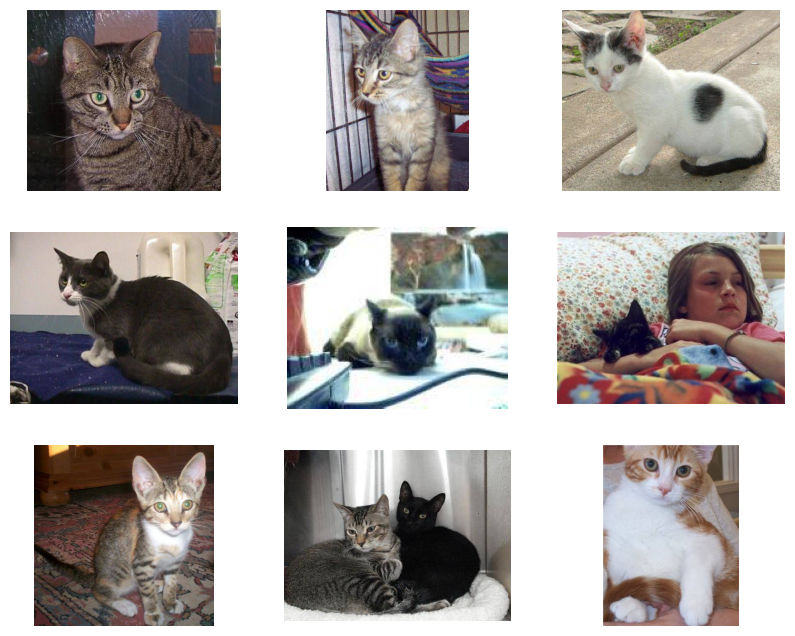

In [3]:
cat_paths = ['../data/raw/train/cat.1.jpg','../data/raw/train/cat.2.jpg','../data/raw/train/cat.3.jpg','../data/raw/train/cat.4.jpg','../data/raw/train/cat.5.jpg','../data/raw/train/cat.6.jpg','../data/raw/train/cat.7.jpg','../data/raw/train/cat.8.jpg','../data/raw/train/cat.9.jpg']

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,8))

for ax, path in zip(axes.flatten(), cat_paths):
    img = Image.open(path)
    ax.imshow(img)
    ax.axis('off')


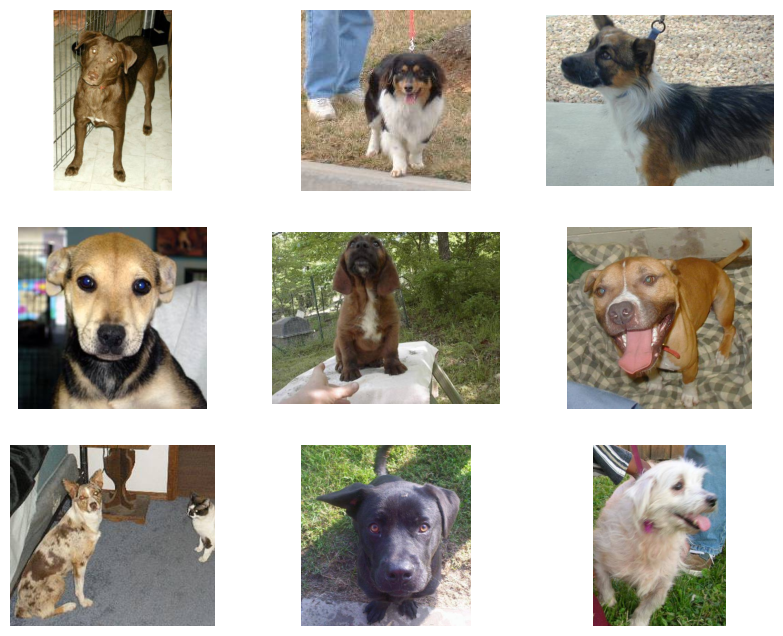

In [4]:
dog_paths = ['../data/raw/train/dog.1.jpg','../data/raw/train/dog.2.jpg','../data/raw/train/dog.3.jpg','../data/raw/train/dog.4.jpg','../data/raw/train/dog.5.jpg','../data/raw/train/dog.6.jpg','../data/raw/train/dog.7.jpg','../data/raw/train/dog.8.jpg','../data/raw/train/dog.9.jpg']

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,8))

for ax, path in zip(axes.flatten(), dog_paths):
    img = Image.open(path)
    ax.imshow(img)
    ax.axis('off')

Upon inspection, not all are 200x200. Need to do some processing

In [5]:
cat_string = '../data/raw/train/cat.'
save_string = '../data/processed/cat/cat'
end_string = '.jpg'
#12499 is the last cat image

for i in range(0,12500):
    cpath = cat_string + str(i) + end_string
    img = Image.open(cpath)
    img_resized = img.resize((200,200), Image.Resampling.LANCZOS)
    spath = save_string + str(i) + end_string
    img_resized.save(spath)


In [6]:
dog_string = '../data/raw/train/dog.'
saved_string = '../data/processed/dog/dog'
end_string = '.jpg'

for i in range(0,12500):
    cpath = dog_string + str(i) + end_string
    img = Image.open(cpath)
    img_resized = img.resize((200,200), Image.Resampling.LANCZOS)
    spath = saved_string + str(i) + end_string
    img_resized.save(spath)

Realized Keras has the ability to resize images...

In [7]:
train_ds, val_ds = keras.src.utils.image_dataset_from_directory("../data/processed", validation_split=0.2, subset="both", seed=42, image_size=(200,200), batch_size=10)

Found 25000 files belonging to 2 classes.
Using 20000 files for training.
Using 5000 files for validation.


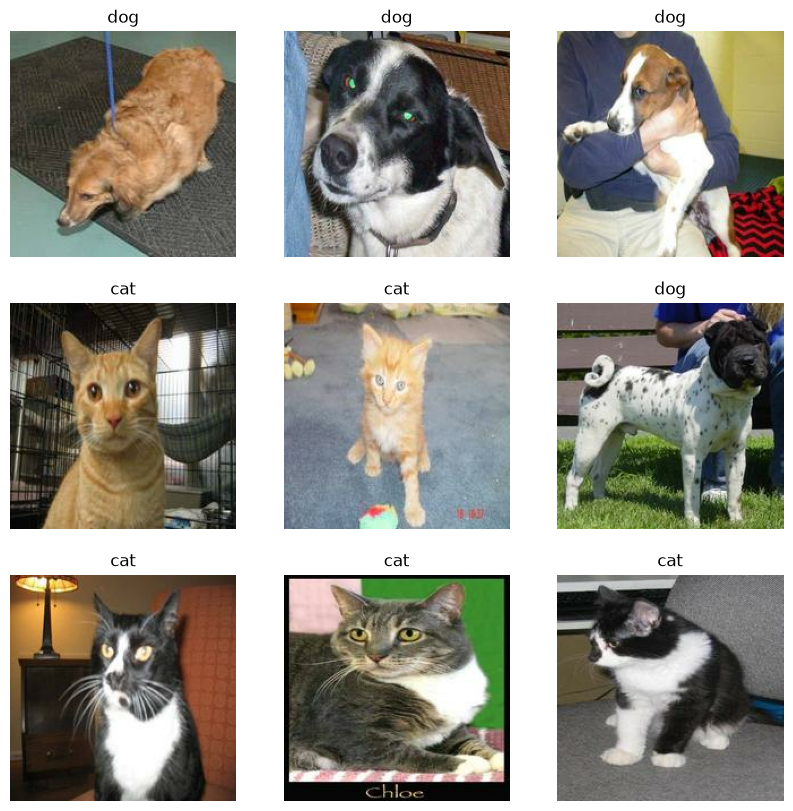

In [8]:
class_names = ["cat", "dog"]
plt.figure(figsize=(10,10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

Now instatiate the model

In [56]:
model = Sequential()
model.add(tf.keras.layers.Rescaling(1./255))
model.add(tf.keras.layers.Conv2D(32,3,activation='relu'))
model.add(tf.keras.layers.MaxPooling2D())
model.add(tf.keras.layers.SpatialDropout2D(0.15))
model.add(tf.keras.layers.Conv2D(32,3,activation='relu'))
model.add(tf.keras.layers.MaxPooling2D())
model.add(tf.keras.layers.SpatialDropout2D(0.15))
model.add(tf.keras.layers.Conv2D(32,3,activation='relu'))
model.add(tf.keras.layers.MaxPooling2D())
model.add(tf.keras.layers.SpatialDropout2D(0.15))
model.add(tf.keras.layers.Flatten())
model.add(Dense(units=128, activation='relu'))
model.add(tf.keras.layers.Dropout(0.25))
#model.add(Dense(units=64, activation='relu'))
model.add(Dense(units=2))

In [59]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint(filepath='../models/checkpoint.keras', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

In [60]:
model.compile(loss = tf.losses.SparseCategoricalCrossentropy(from_logits = True), optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

In [61]:
model.fit(train_ds, epochs=15, validation_data = val_ds, batch_size=10, callbacks=[early_stopping, checkpoint])

Epoch 1/15
2000/2000 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5333 - loss: 0.6935
Epoch 1: val_loss improved from None to 0.69431, saving model to ../models/checkpoint.keras

Epoch 1: finished saving model to ../models/checkpoint.keras
2000/2000 ━━━━━━━━━━━━━━━━━━━━ 52s 25ms/step - accuracy: 0.5333 - loss: 0.6935 - val_accuracy: 0.4914 - val_loss: 0.6943
Epoch 2/15
2000/2000 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.6567 - loss: 0.6244
Epoch 2: val_loss improved from 0.69431 to 0.58050, saving model to ../models/checkpoint.keras

Epoch 2: finished saving model to ../models/checkpoint.keras
2000/2000 ━━━━━━━━━━━━━━━━━━━━ 55s 28ms/step - accuracy: 0.6567 - loss: 0.6244 - val_accuracy: 0.7026 - val_loss: 0.5805
Epoch 3/15
1998/2000 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.7116 - loss: 0.5544
Epoch 3: val_loss improved from 0.58050 to 0.50251, saving model to ../models/checkpoint.keras

Epoch 3: finished saving model to ../models/checkpoint.keras
2000/2000 ━━━━━━━━━━━━━

In [62]:
test_cat =  tf.keras.utils.load_img("../data/interim/test_cat.jpg", target_size=(200, 200))
img_array = tf.keras.utils.img_to_array(test_cat)
img_array = tf.expand_dims(img_array, 0)
predictions = model.predict(img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


cat 98.74314


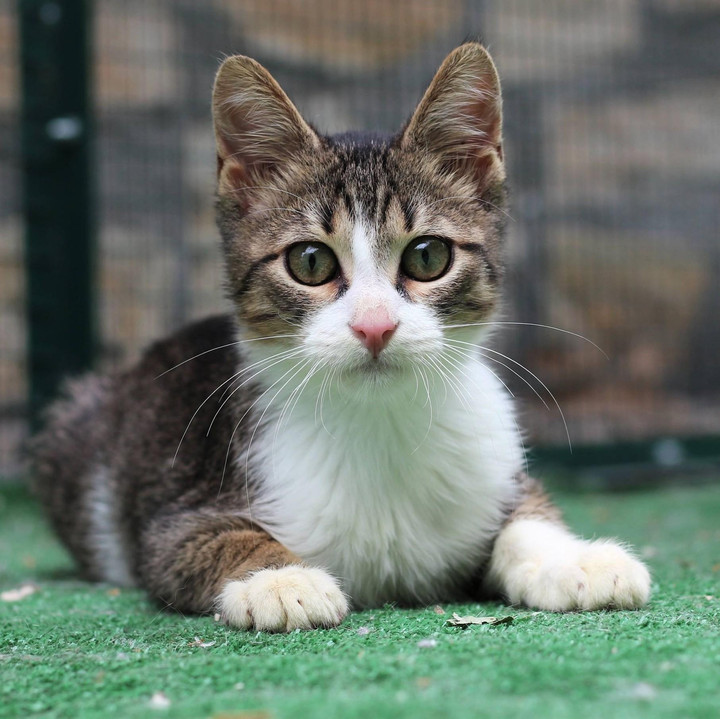

In [63]:
score = tf.nn.softmax(predictions[0])
predicted_class_idx = np.argmax(score)
predicted_label = class_names[predicted_class_idx]
confidence_score = 100 * np.max(score)

print(predicted_label, confidence_score)
test_cat_img = Image.open("../data/interim/test_cat.jpg")
display(test_cat_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
cat 98.74314


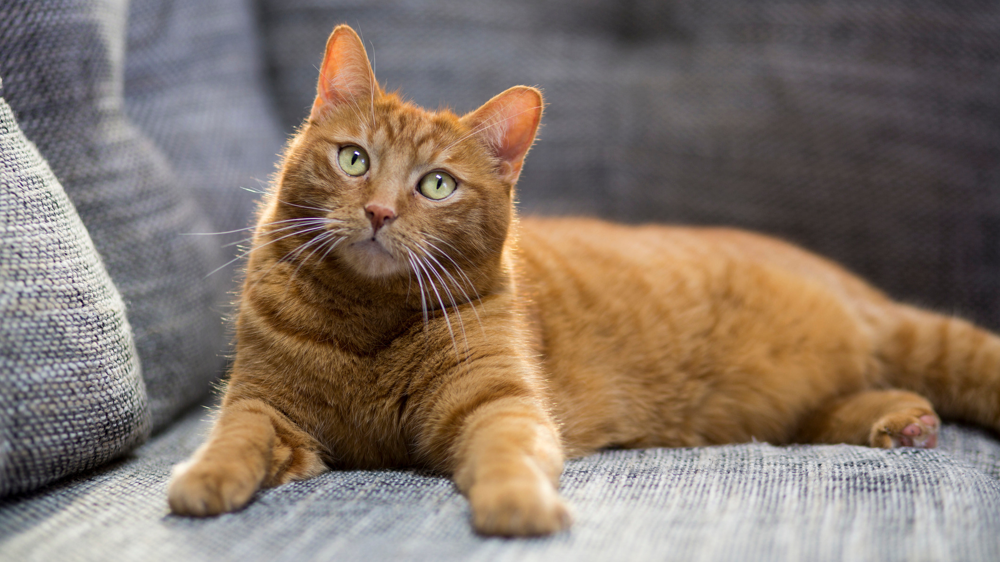

In [64]:
test_cat_2 =  tf.keras.utils.load_img("../data/interim/test_cat_2.jpg", target_size=(200, 200))
img_array_c = tf.keras.utils.img_to_array(test_cat_2)
img_array_c = tf.expand_dims(img_array_c, 0)
predictions_c = model.predict(img_array_c)

score_c = tf.nn.softmax(predictions_c[0])
predicted_class_idx = np.argmax(score_c)
predicted_label = class_names[predicted_class_idx]
confidence_score = 100 * np.max(score)

print(predicted_label, confidence_score)
test_cat_2_img = Image.open("../data/interim/test_cat_2.jpg")
display(test_cat_2_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
dog 98.74314


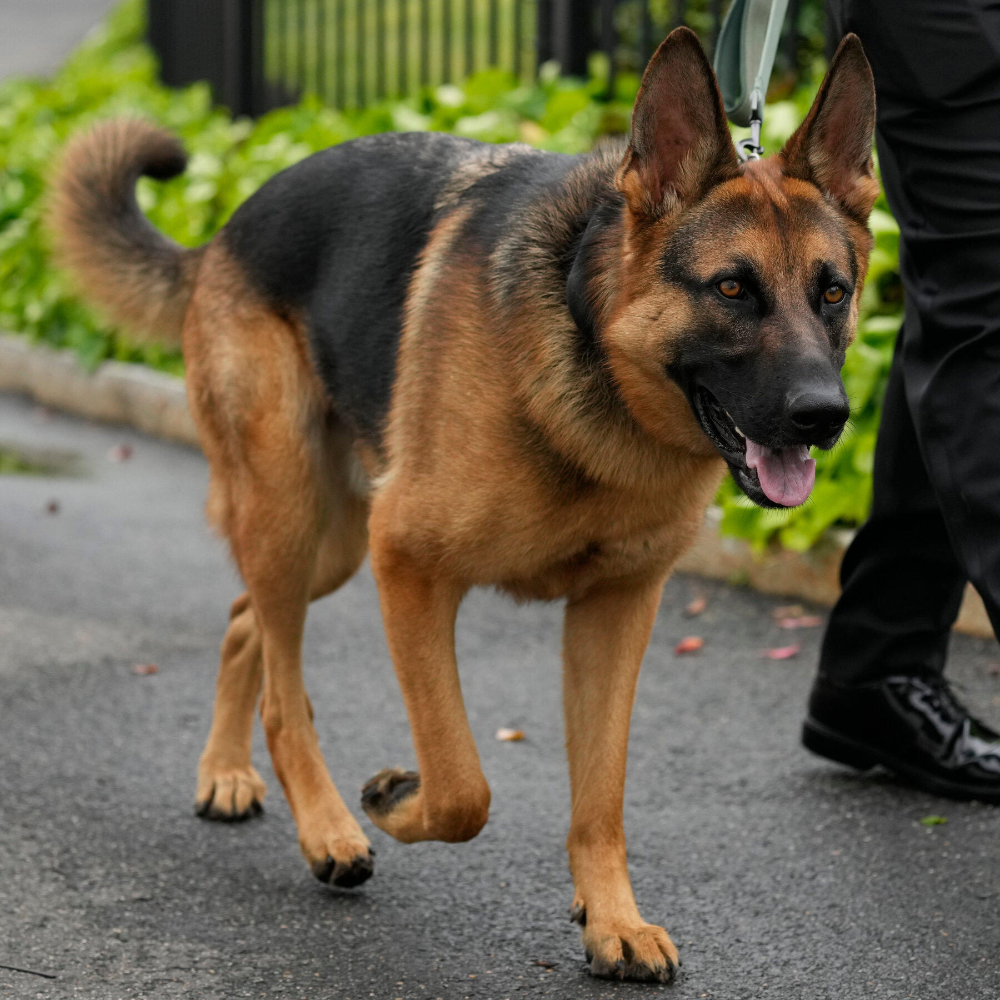

In [65]:
test_dog = tf.keras.utils.load_img("../data/interim/test_dog.jpg", target_size=(200, 200))
img_array_d = tf.keras.utils.img_to_array(test_dog)
img_array_d = tf.expand_dims(img_array_d, 0)
predictions_d = model.predict(img_array_d)

score_d = tf.nn.softmax(predictions_d[0])
predicted_class_idx = np.argmax(score_d)
predicted_label = class_names[predicted_class_idx]
confidence_score = 100 * np.max(score)

print(predicted_label, confidence_score)
test_dog_img = Image.open("../data/interim/test_dog.jpg")
display(test_dog_img)

In [66]:
test_catdog =  tf.keras.utils.load_img("../data/interim/test_catdog.jpg", target_size=(200, 200))
img_array2 = tf.keras.utils.img_to_array(test_catdog)
img_array2 = tf.expand_dims(img_array2, 0)
predictions2 = model.predict(img_array2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


dog 61.798542


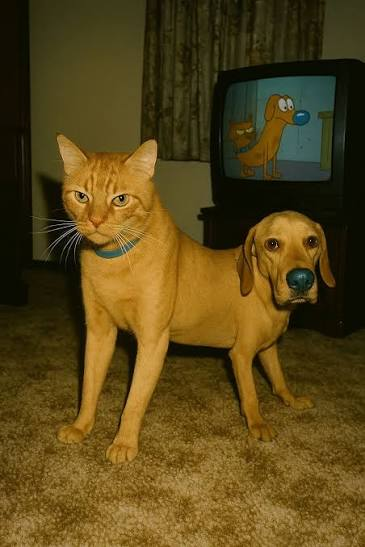

In [67]:
score = tf.nn.softmax(predictions2[0])
predicted_class_idx = np.argmax(score)
predicted_label = class_names[predicted_class_idx]
confidence_score = 100 * np.max(score)

print(predicted_label, confidence_score)
test_catdog_img = Image.open("../data/interim/test_catdog.jpg")
display(test_catdog_img)

Now save the model

In [68]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open("../models/model.tflite", 'wb') as file:
  file.write(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\absur\AppData\Local\Temp\tmprzhfe8fl\assets


INFO:tensorflow:Assets written to: C:\Users\absur\AppData\Local\Temp\tmprzhfe8fl\assets


Saved artifact at 'C:\Users\absur\AppData\Local\Temp\tmprzhfe8fl'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 200, 200, 3), dtype=tf.float32, name='keras_tensor_110')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  1918451428496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1918451425808: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1918451426576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1918451421200: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1918451420240: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1918451419664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1918451420432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1918451419472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1918451421392: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1917775364368: TensorSpec(shape=(), dtype=tf.resource, name=None)
